# Detection of Diabetes Model

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.


The datasets consist of several medical predictor (independent) variables and one target (dependent) variable, Outcome. Independent variables include the number of pregnancies the patient has had, their BMI, insulin level, age, and so on.

The Dataset can be found here at https://www.kaggle.com/datasets/uciml/pima-indians-diabetes-database

## Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas_profiling as pp

## Read in The Data

In [2]:
data = pd.read_csv("diabetes.csv")

In [3]:
# Checking head of the data
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


## Exploratory Data Analysis

<AxesSubplot:>

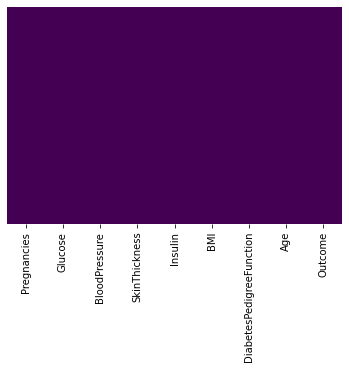

In [5]:
# Checking for null values using heatmap
sns.heatmap(data.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


Min value 0 in columns such as Glucose, Blood Pressure, SkinThickness, Insulin and BMI doesnt make any sense.

It means missing value in these columns is replaced by 0

In [7]:
# Filling NaN wherever 0 is present
data_copy = data.copy(deep = True)
data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

Now we will have missing values

<AxesSubplot:>

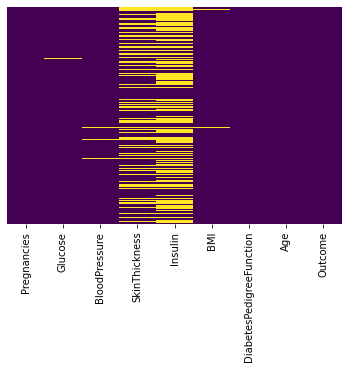

In [8]:
sns.heatmap(data_copy.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [9]:
data_copy.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [10]:
data_copy["BloodPressure"].fillna(data_copy["BloodPressure"].mean(),inplace=True)

In [11]:
data_copy["SkinThickness"].fillna(data_copy["SkinThickness"].median(),inplace=True)

In [12]:
data_copy["Insulin"].fillna(data_copy["Insulin"].median(),inplace=True)

In [13]:
#for GLUCOSE,BMI
data_copy.dropna(inplace=True)

<AxesSubplot:>

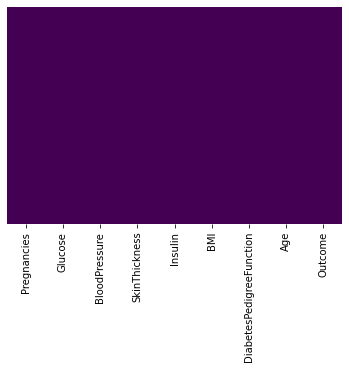

In [14]:
sns.heatmap(data_copy.isnull(),cmap="viridis",cbar=False,yticklabels=False)

In [15]:
pp.ProfileReport(data_copy)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

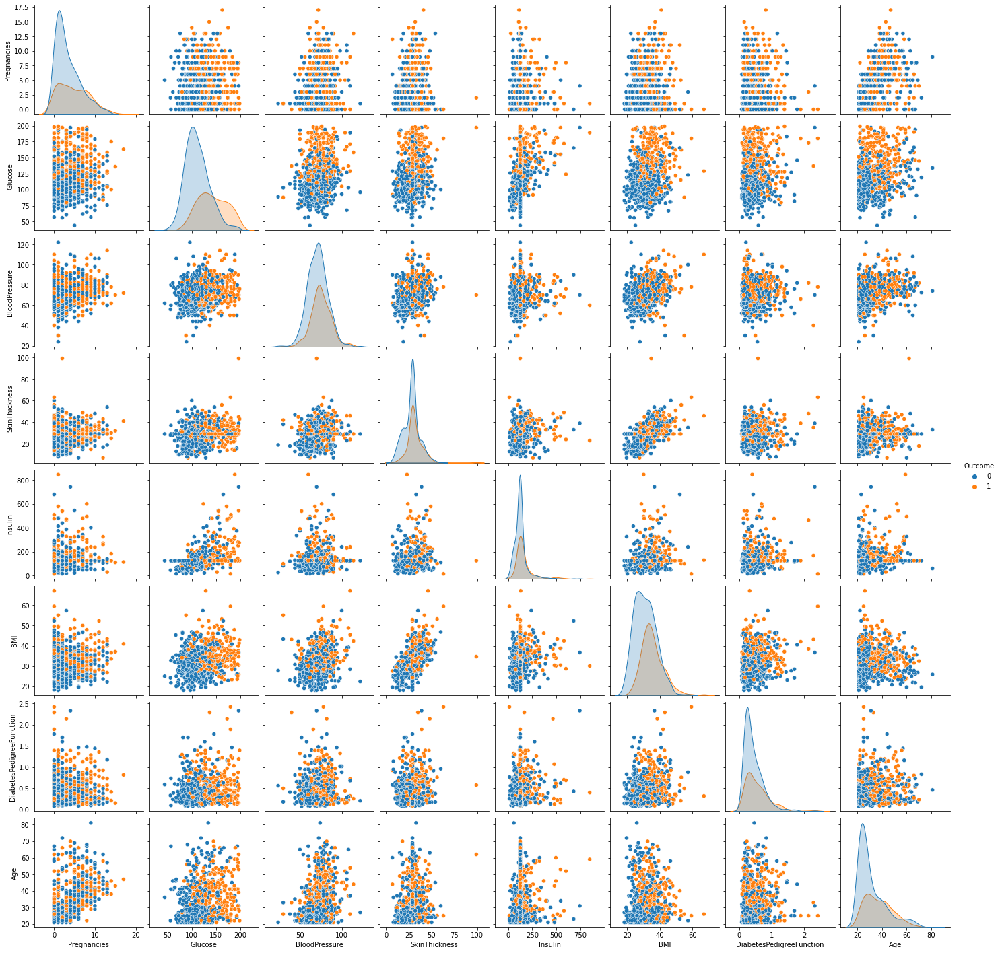

In [17]:
sns.pairplot(data_copy,hue="Outcome")

In [18]:
X=data_copy.drop("Outcome",axis=1)
Y=data_copy["Outcome"]

## Feature Scaling

Some models require Feature Scaling and Some Don't

KNN requires while Random Forest doesnt

In [19]:
#standardizing or normalizing - scaling the data
from sklearn.preprocessing import StandardScaler

In [20]:
scaler = StandardScaler()

In [23]:
# We are only transforming our input features
scaled_feat=scaler.fit_transform(X)

In [26]:
df=pd.DataFrame(scaled_feat,columns=X.columns)

In [27]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.637110,0.852119,-0.033012,0.664401,-0.185893,0.165409,0.466671,1.426086
1,-0.845274,-1.207994,-0.527294,-0.013829,-0.185893,-0.845521,-0.369975,-0.197622
2,1.230064,1.996626,-0.692055,-0.013829,-0.185893,-1.322102,0.603081,-0.112164
3,-0.845274,-1.077194,-0.527294,-0.692059,-0.541861,-0.628893,-0.927739,-1.052206
4,-1.141751,0.492416,-2.669183,0.664401,0.307868,1.537386,5.501706,-0.026706


## Splitting the Dataset

In [28]:
from sklearn.model_selection import train_test_split

In [50]:
x_train,x_test,y_train,y_test=train_test_split(scaled_feat,Y,test_size=0.3,random_state=42)

## Creating Model

In [51]:
# KNN
from sklearn.neighbors import KNeighborsClassifier

In [59]:
knn=KNeighborsClassifier(n_neighbors=25)

In [60]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=25)

In [61]:
prediction = knn.predict(x_test)

In [62]:
from sklearn.metrics import classification_report

In [63]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.77      0.92      0.84       143
           1       0.80      0.52      0.63        83

    accuracy                           0.77       226
   macro avg       0.78      0.72      0.73       226
weighted avg       0.78      0.77      0.76       226



Overall 77% accuracy with KNN model

In [66]:
# Checking Target Labels
data_copy['Outcome'].value_counts()

0    488
1    264
Name: Outcome, dtype: int64

We can see we have unbalanced dataset here.

## Balancing the Dataset

pip install imblearn

In [67]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

We wont use our scaled features in Random Forest

In [68]:
X=data_copy.drop("Outcome",axis=1)
Y=data_copy["Outcome"]

In [69]:
ros=RandomOverSampler()
X,Y=ros.fit_resample(X,Y)

In [70]:
Y.value_counts()

1    488
0    488
Name: Outcome, dtype: int64

In [71]:
# Splitting again as we dont want the scaled features
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3,random_state=42)

In [72]:
# Importing the Model
from sklearn.ensemble import RandomForestClassifier

In [73]:
rfc = RandomForestClassifier(n_estimators=45)

In [74]:
rfc.fit(X_train,Y_train)

RandomForestClassifier(n_estimators=45)

In [75]:
rfc_prediction = rfc.predict(X_test)

In [76]:
print("RFC Evaluation Report")
print(classification_report(Y_test,rfc_prediction))
print("--------------------------------------------------------")

RFC Evaluation Report
              precision    recall  f1-score   support

           0       0.87      0.79      0.83       147
           1       0.81      0.88      0.84       146

    accuracy                           0.83       293
   macro avg       0.84      0.83      0.83       293
weighted avg       0.84      0.83      0.83       293

--------------------------------------------------------


## Saving our Model

In [77]:
import pickle

In [78]:
pickle.dump(rfc,open("diabetes_model.sav",'wb'))

## Checking if our saved model is working or not.

In [80]:
# loading the saved model
loaded_model = pickle.load(open('diabetes_model.sav', 'rb'))

In [81]:
input_data = (5,166,72,19,175,25.8,0.587,51)

# changing the input_data to numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the array as we are predicting for one instance
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = loaded_model.predict(input_data_reshaped)
print(prediction)

if (prediction[0] == 0):
    print('The person is not diabetic')
else:
    print('The person is diabetic')

[1]
The person is diabetic


C:\Users\Deeshu\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [82]:
for column in X.columns:
    print(column)

Pregnancies
Glucose
BloodPressure
SkinThickness
Insulin
BMI
DiabetesPedigreeFunction
Age
